<a href="https://colab.research.google.com/github/araj34546474/Bootcamp-/blob/main/crophelathmonitoring.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
def classify_crop_health(gndvi):
    """Classifies crop health based on GNDVI thresholds."""
    median_gndvi = np.nanmedian(gndvi)
    healthy_threshold = median_gndvi + 0.1
    moderate_threshold = median_gndvi - 0.1 # Changed moderate_hreshold to moderate_threshold

    healthy_mask = gndvi > healthy_threshold
    moderate_mask = (gndvi > moderate_threshold) & (gndvi <= healthy_threshold)
    stressed_mask = gndvi <= moderate_threshold

    crop_health_map = np.zeros((gndvi.shape[0], gndvi.shape[1], 3), dtype=np.uint8)
    crop_health_map[healthy_mask] = [34, 139, 34]
    crop_health_map[moderate_mask] = [255, 165, 0]
    crop_health_map[stressed_mask] = [255, 0, 0]

    return crop_health_map, median_gndvi

Predicted GNDVI for SPAD 45: 0.39
Expected Yield: HIGH ✅


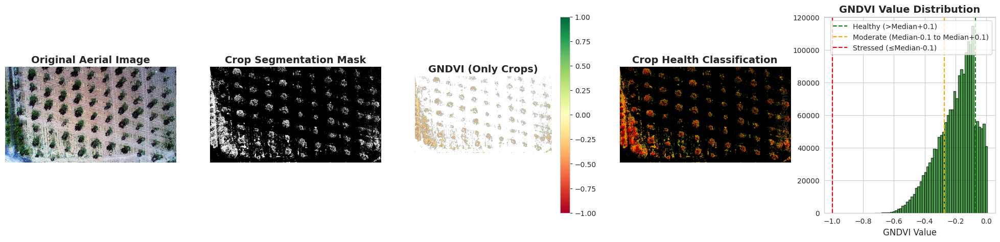

🔹 Analysis Complete: Images Saved Successfully!


<ipython-input-9-adc2063251e4>:134: RuntimeWarning: invalid value encountered in cast
  cv2.imwrite("/mnt/data/gndvi_output.png", (gndvi * 255).astype(np.uint8))


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression

# Apply seaborn styling for better visuals
sns.set_style("whitegrid")

def preprocess_image(image_path):
    """Loads and enhances an aerial image for GNDVI analysis."""
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Apply Gaussian Blur to remove noise
    image = cv2.GaussianBlur(image, (5, 5), 0)

    # Histogram Equalization for contrast enhancement
    for i in range(3):
        image[:, :, i] = cv2.equalizeHist(image[:, :, i])

    return image

def segment_crops(image):
    """Segments crop areas using a green color mask in HSV."""
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    # Define green range in HSV (adjust based on crop type)
    lower_green = np.array([30, 40, 40])
    upper_green = np.array([90, 255, 255])

    # Create a mask to extract green areas (vegetation)
    mask = cv2.inRange(hsv, lower_green, upper_green)
    segmented_image = cv2.bitwise_and(image, image, mask=mask)

    return segmented_image, mask

def compute_gndvi(image, mask):
    """Calculates GNDVI, applying the mask to focus on crops only."""
    green = image[:, :, 1].astype(np.float32)  # Green band
    nir = image[:, :, 0].astype(np.float32)  # Assuming NIR is in the Red channel

    eps = 1e-6  # Avoid division by zero
    gndvi = (nir - green) / (nir + green + eps)
    gndvi = np.clip(gndvi, -1, 1)

    # Apply mask to retain only crop pixels
    gndvi_masked = np.where(mask > 0, gndvi, np.nan)

    return gndvi_masked

def classify_crop_health(gndvi):
    """Classifies crop health based on GNDVI thresholds."""
    median_gndvi = np.nanmedian(gndvi)  # Use nanmedian to ignore soil
    healthy_threshold = median_gndvi + 0.1
    moderate_threshold = median_gndvi - 0.1

    healthy_mask = gndvi > healthy_threshold
    moderate_mask = (gndvi > moderate_threshold) & (gndvi <= healthy_threshold)
    stressed_mask = gndvi <= moderate_threshold

    # Generate color-coded crop health map
    crop_health_map = np.zeros((gndvi.shape[0], gndvi.shape[1], 3), dtype=np.uint8)
    crop_health_map[healthy_mask] = [34, 139, 34]  # Dark Green for Healthy
    crop_health_map[moderate_mask] = [255, 165, 0]  # Orange for Moderate
    crop_health_map[stressed_mask] = [255, 0, 0]  # Red for Stressed

    return crop_health_map, median_gndvi

def predict_yield(spad_value):
    """Predicts crop yield based on SPAD values using a trained Linear Regression model."""
    spad_values = np.array([30, 35, 40, 45, 50, 55, 60]).reshape(-1, 1)  # Chlorophyll values
    gndvi_values = np.array([0.1, 0.15, 0.3, 0.4, 0.5, 0.6, 0.7])  # Corresponding GNDVI

    regressor = LinearRegression()
    regressor.fit(spad_values, gndvi_values)

    predicted_gndvi = regressor.predict(np.array([[spad_value]]))
    return predicted_gndvi[0]

def analyze_crop_health(image_path, spad_value):
    """Processes image, segments crops, computes GNDVI, classifies health & predicts yield."""
    image = preprocess_image(image_path)
    segmented_image, mask = segment_crops(image)
    gndvi = compute_gndvi(image, mask)
    crop_health_map, median_gndvi = classify_crop_health(gndvi)

    overlay = cv2.addWeighted(image, 0.5, crop_health_map, 0.5, 0)

    # Predict expected GNDVI & yield
    predicted_gndvi = predict_yield(spad_value)
    yield_prediction = "HIGH ✅" if predicted_gndvi > median_gndvi + 0.1 else "MODERATE ⚠️" if predicted_gndvi > median_gndvi - 0.1 else "LOW 🚨"

    print(f"Predicted GNDVI for SPAD {spad_value}: {predicted_gndvi:.2f}")
    print(f"Expected Yield: {yield_prediction}")

    # **📊 Improved Visualization**
    fig, ax = plt.subplots(1, 5, figsize=(25, 5))

    # Original Image
    ax[0].imshow(image)
    ax[0].set_title("Original Aerial Image", fontsize=14, fontweight='bold')
    ax[0].axis("off")

    # Crop Segmentation Mask
    ax[1].imshow(mask, cmap="gray")
    ax[1].set_title("Crop Segmentation Mask", fontsize=14, fontweight='bold')
    ax[1].axis("off")

    # GNDVI Visualization with Contours
    gndvi_plot = ax[2].imshow(gndvi, cmap="RdYlGn", vmin=-1, vmax=1)
    ax[2].set_title("GNDVI (Only Crops)", fontsize=14, fontweight='bold')
    ax[2].axis("off")
    plt.colorbar(gndvi_plot, ax=ax[2])

    # Crop Health Map
    ax[3].imshow(crop_health_map)
    ax[3].set_title("Crop Health Classification", fontsize=14, fontweight='bold')
    ax[3].axis("off")

    # GNDVI Histogram
    ax[4].hist(gndvi.ravel(), bins=50, color='green', alpha=0.7, edgecolor="black")
    ax[4].axvline(x=median_gndvi + 0.1, color='green', linestyle='dashed', label="Healthy (>Median+0.1)")
    ax[4].axvline(x=median_gndvi - 0.1, color='orange', linestyle='dashed', label="Moderate (Median-0.1 to Median+0.1)")
    ax[4].axvline(x=-1, color='red', linestyle='dashed', label="Stressed (≤Median-0.1)")
    ax[4].legend()
    ax[4].set_title("GNDVI Value Distribution", fontsize=14, fontweight='bold')
    ax[4].set_xlabel("GNDVI Value", fontsize=12)
    ax[4].set_ylabel("Pixel Count", fontsize=12)

    plt.show()

    # Save outputs
    cv2.imwrite("/mnt/data/gndvi_output.png", (gndvi * 255).astype(np.uint8))
    cv2.imwrite("/mnt/data/crop_health_map.png", crop_health_map)
    cv2.imwrite("/mnt/data/overlay.png", overlay)

    print("🔹 Analysis Complete: Images Saved Successfully!")

# **🚀 Run the Analysis**
image_path = "/content/DJI_0027.JPG"
spad_value = 45  # Assign a value to spad_value (e.g., 45)

analyze_crop_health(image_path, spad_value)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression

# Apply seaborn styling for better visuals
sns.set_style("whitegrid")

def preprocess_image(image_path):
    """Loads and

SyntaxError: incomplete input (<ipython-input-5-6a35be61dc7a>, line 11)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression

# ... (rest of your code) ...



In [ ]:
# **🚀 Run the Analysis**
image_path = "/content/DJI_0027.JPG"
spad_value = 45  # Assign a value to spad_value (e.g., 45)

analyze_crop_health(image_path, spad_value)

error: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


Predicted GNDVI for SPAD 48: 0.46
Expected Yield: HIGH 🌱✅


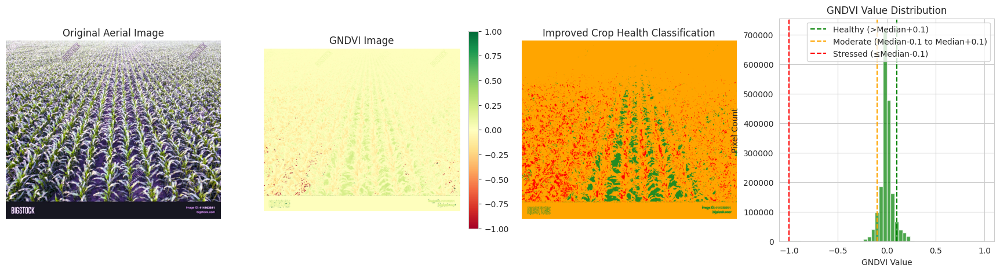

Enhanced GNDVI Image saved as 'gndvi_output.png'
Enhanced Crop Health Map saved as 'crop_health_map.png'
Overlay Image saved as 'overlay.png'


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

def preprocess_image(image_path):
    """Loads, converts, and enhances an aerial image for GNDVI analysis."""
    # Load the image
    image = cv2.imread(image_path)

    # Convert to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Apply Gaussian Blur to reduce noise
    image = cv2.GaussianBlur(image, (5, 5), 0)

    # Histogram Equalization (Contrast Enhancement)
    for i in range(3):
        image[:, :, i] = cv2.equalizeHist(image[:, :, i])

    return image

def compute_gndvi(image):
    """Calculates the GNDVI index from the processed image."""
    # Extract Green and NIR bands (Assuming NIR is stored in the Red channel)
    green = image[:, :, 1].astype(np.float32)  # Green band
    nir = image[:, :, 0].astype(np.float32)  # NIR band (Check dataset)

    # Compute GNDVI (Green Normalized Difference Vegetation Index)
    eps = 1e-6  # Small constant to avoid division by zero
    gndvi = (nir - green) / (nir + green + eps)
    gndvi = np.clip(gndvi, -1, 1)  # Normalize between -1 and 1

    return gndvi

def classify_crop_health(gndvi):
    """Classifies crop health based on GNDVI thresholds."""
    median_gndvi = np.median(gndvi)
    healthy_threshold = median_gndvi + 0.1
    moderate_threshold = median_gndvi - 0.1

    # Crop health classification
    healthy_mask = gndvi > healthy_threshold
    moderate_mask = (gndvi > moderate_threshold) & (gndvi <= healthy_threshold)
    stressed_mask = gndvi <= moderate_threshold

    # Color-coded crop health map
    crop_health_map = np.zeros((gndvi.shape[0], gndvi.shape[1], 3), dtype=np.uint8)
    crop_health_map[healthy_mask] = [34, 139, 34]  # Dark Green for Healthy
    crop_health_map[moderate_mask] = [255, 165, 0]  # Orange for Moderate
    crop_health_map[stressed_mask] = [255, 0, 0]  # Red for Stressed

    return crop_health_map

def predict_yield(spad_value):
    """Predicts crop yield potential based on SPAD (chlorophyll meter) values."""
    # Sample SPAD vs GNDVI values for training
    spad_values = np.array([30, 35, 40, 45, 50, 55, 60]).reshape(-1, 1)  # Chlorophyll values
    gndvi_values = np.array([0.1, 0.15, 0.3, 0.4, 0.5, 0.6, 0.7])  # Corresponding GNDVI

    # Train a Linear Regression model
    regressor = LinearRegression()
    regressor.fit(spad_values, gndvi_values)

    # Predict expected GNDVI
    predicted_gndvi = regressor.predict(np.array([[spad_value]]))

    return predicted_gndvi[0]

def analyze_crop_health(image_path, spad_value):
    """Automates preprocessing, GNDVI computation, classification, and yield prediction."""
    # Step 1: Preprocess the Image
    image = preprocess_image(image_path)

    # Step 2: Compute GNDVI
    gndvi = compute_gndvi(image)

    # Step 3: Classify Crop Health
    crop_health_map = classify_crop_health(gndvi)

    # Step 4: Overlay classification on the original image
    overlay = cv2.addWeighted(image, 0.5, crop_health_map, 0.5, 0)

    # Step 5: Predict Crop Yield based on SPAD
    predicted_gndvi = predict_yield(spad_value)

    print(f"Predicted GNDVI for SPAD {spad_value}: {predicted_gndvi:.2f}")

    if predicted_gndvi > np.median(gndvi) + 0.1:
        print("Expected Yield: HIGH 🌱✅")
    elif predicted_gndvi > np.median(gndvi) - 0.1:
        print("Expected Yield: MODERATE 🌿⚠️")
    else:
        print("Expected Yield: LOW 🚨")

    # **Plot Results**
    fig, ax = plt.subplots(1, 4, figsize=(22, 5))

    # Original Image
    ax[0].imshow(image)
    ax[0].set_title("Original Aerial Image")
    ax[0].axis("off")

    # GNDVI Visualization
    gndvi_plot = ax[1].imshow(gndvi, cmap="RdYlGn", vmin=-1, vmax=1)
    ax[1].set_title("GNDVI Image")
    ax[1].axis("off")
    plt.colorbar(gndvi_plot, ax=ax[1], fraction=0.046, pad=0.04)

    # Improved Crop Health Map
    ax[2].imshow(crop_health_map)
    ax[2].set_title("Improved Crop Health Classification")
    ax[2].axis("off")

    # Histogram of GNDVI Values
    ax[3].hist(gndvi.ravel(), bins=50, color='green', alpha=0.7)
    ax[3].axvline(x=np.median(gndvi) + 0.1, color='green', linestyle='dashed', label="Healthy (>Median+0.1)")
    ax[3].axvline(x=np.median(gndvi) - 0.1, color='orange', linestyle='dashed', label="Moderate (Median-0.1 to Median+0.1)")
    ax[3].axvline(x=-1, color='red', linestyle='dashed', label="Stressed (≤Median-0.1)")
    ax[3].legend()
    ax[3].set_title("GNDVI Value Distribution")
    ax[3].set_xlabel("GNDVI Value")
    ax[3].set_ylabel("Pixel Count")

    plt.show()

    # Save results
    cv2.imwrite("/mnt/data/gndvi_output.png", (gndvi * 255).astype(np.uint8))
    cv2.imwrite("/mnt/data/crop_health_map.png", crop_health_map)
    cv2.imwrite("/mnt/data/overlay.png", overlay)

    print("Enhanced GNDVI Image saved as 'gndvi_output.png'")
    print("Enhanced Crop Health Map saved as 'crop_health_map.png'")
    print("Overlay Image saved as 'overlay.png'")

# **🚀 Run the Analysis**
image_path = "/content/test2.jpg"
spad_value = 48  # Example SPAD value from a chlorophyll meter

analyze_crop_health(image_path, spad_value)


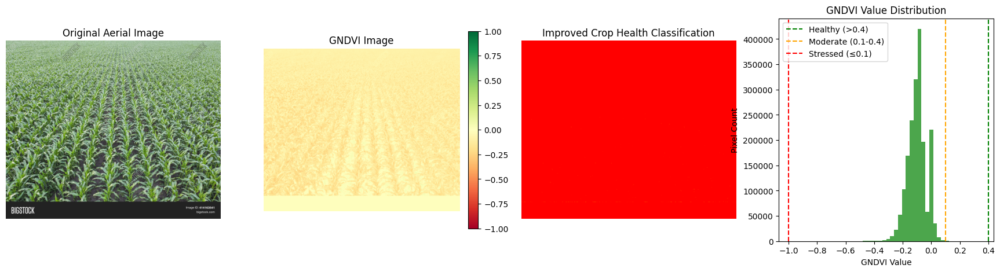

Improved GNDVI Image saved as 'gndvi_output.png'
Improved Crop Health Map saved as 'crop_health_map.png'
Overlay Image saved as 'overlay.png'


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the aerial image (Update path accordingly)
image_path = "/content/test2.jpg"
image = cv2.imread(image_path)

# Convert image to RGB (OpenCV loads in BGR by default)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Extract Green and NIR bands (Verify correct NIR channel for your dataset)
green = image[:, :, 1].astype(np.float32)  # Green band
nir = image[:, :, 0].astype(np.float32)  # Assuming Red/NIR is in Red channel

# Compute GNDVI (Green Normalized Difference Vegetation Index)
gndvi = (nir - green) / (nir + green + 1e-6)  # Avoid division by zero
gndvi = np.clip(gndvi, -1, 1)  # Normalize values between -1 and 1

# Normalize GNDVI for visualization
gndvi_normalized = cv2.normalize(gndvi, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Improved Crop Health Classification
healthy_mask = gndvi > 0.4  # Adjusted for realistic thresholds
moderate_mask = (gndvi > 0.1) & (gndvi <= 0.4)
stressed_mask = gndvi <= 0.1

# Create a better color-coded crop health map
crop_health_map = np.zeros((gndvi.shape[0], gndvi.shape[1], 3), dtype=np.uint8)
crop_health_map[healthy_mask] = [34, 139, 34]  # Dark Green for Healthy
crop_health_map[moderate_mask] = [255, 165, 0]  # Orange for Moderate
crop_health_map[stressed_mask] = [255, 0, 0]  # Red for Stressed

# Overlay classification mask on original image
overlay = cv2.addWeighted(image, 0.5, crop_health_map, 0.5, 0)

# Plot results
fig, ax = plt.subplots(1, 4, figsize=(22, 5))

# Original Image
ax[0].imshow(image)
ax[0].set_title("Original Aerial Image")
ax[0].axis("off")

# GNDVI Visualization
gndvi_plot = ax[1].imshow(gndvi, cmap="RdYlGn", vmin=-1, vmax=1)
ax[1].set_title("GNDVI Image")
ax[1].axis("off")
plt.colorbar(gndvi_plot, ax=ax[1], fraction=0.046, pad=0.04)

# Improved Crop Health Map
ax[2].imshow(crop_health_map)
ax[2].set_title("Improved Crop Health Classification")
ax[2].axis("off")

# Histogram of GNDVI Values
ax[3].hist(gndvi.ravel(), bins=50, color='green', alpha=0.7)
ax[3].axvline(x=0.4, color='green', linestyle='dashed', label="Healthy (>0.4)")
ax[3].axvline(x=0.1, color='orange', linestyle='dashed', label="Moderate (0.1-0.4)")
ax[3].axvline(x=-1, color='red', linestyle='dashed', label="Stressed (≤0.1)")
ax[3].legend()
ax[3].set_title("GNDVI Value Distribution")
ax[3].set_xlabel("GNDVI Value")
ax[3].set_ylabel("Pixel Count")

plt.show()

# Save the images
cv2.imwrite("/mnt/data/gndvi_output.png", gndvi_normalized)
cv2.imwrite("/mnt/data/crop_health_map.png", crop_health_map)
cv2.imwrite("/mnt/data/overlay.png", overlay)

print("Improved GNDVI Image saved as 'gndvi_output.png'")
print("Improved Crop Health Map saved as 'crop_health_map.png'")
print("Overlay Image saved as 'overlay.png'")


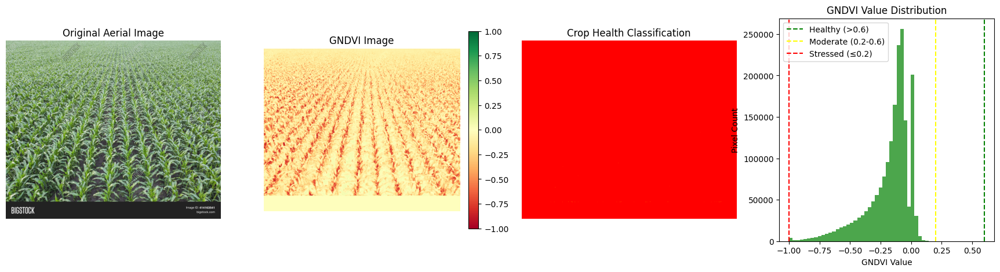

GNDVI Image saved as 'gndvi_output.png'
Crop Health Map saved as 'crop_health_map.png'


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the aerial image (Change 'your_image.jpg' to your actual file path)
image_path = "/content/test2.jpg"  # Update with the correct file path
image = cv2.imread(image_path)

# Convert image to RGB (OpenCV loads in BGR by default)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Extract Green and NIR (assuming Blue is used as a proxy for NIR)
green = image[:, :, 1].astype(np.float32)
nir = image[:, :, 2].astype(np.float32)  # Using Blue as a substitute for NIR

# Compute GNDVI (Green Normalized Difference Vegetation Index)
gndvi = (nir - green) / (nir + green + 1e-6)  # Avoid division by zero
gndvi = np.clip(gndvi, -1, 1)  # Normalize values between -1 and 1

# Normalize GNDVI for visualization (Stretching contrast)
gndvi_normalized = cv2.normalize(gndvi, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Crop Health Classification Based on GNDVI Thresholds
healthy_mask = gndvi > 0.6  # Healthy (Green)
moderate_mask = (gndvi > 0.2) & (gndvi <= 0.6)  # Moderate (Yellow)
stressed_mask = gndvi <= 0.2  # Stressed (Red)

# Create a color-coded crop health map
crop_health_map = np.zeros((gndvi.shape[0], gndvi.shape[1], 3), dtype=np.uint8)
crop_health_map[healthy_mask] = [0, 255, 0]  # Green (Healthy)
crop_health_map[moderate_mask] = [255, 255, 0]  # Yellow (Moderate)
crop_health_map[stressed_mask] = [255, 0, 0]  # Red (Stressed)

# Plot Original, GNDVI Image, Crop Health Map, and Histogram
fig, ax = plt.subplots(1, 4, figsize=(22, 5))

# Original Image
ax[0].imshow(image)
ax[0].set_title("Original Aerial Image")
ax[0].axis("off")

# GNDVI Visualization
gndvi_plot = ax[1].imshow(gndvi, cmap="RdYlGn", vmin=-1, vmax=1)  # Improved contrast
ax[1].set_title("GNDVI Image")
ax[1].axis("off")
plt.colorbar(gndvi_plot, ax=ax[1], fraction=0.046, pad=0.04)

# Crop Health Map
ax[2].imshow(crop_health_map)
ax[2].set_title("Crop Health Classification")
ax[2].axis("off")

# Histogram of GNDVI Values with Labels
ax[3].hist(gndvi.ravel(), bins=50, color='green', alpha=0.7)
ax[3].axvline(x=0.6, color='green', linestyle='dashed', label="Healthy (>0.6)")
ax[3].axvline(x=0.2, color='yellow', linestyle='dashed', label="Moderate (0.2-0.6)")
ax[3].axvline(x=-1, color='red', linestyle='dashed', label="Stressed (≤0.2)")
ax[3].legend()
ax[3].set_title("GNDVI Value Distribution")
ax[3].set_xlabel("GNDVI Value")
ax[3].set_ylabel("Pixel Count")

plt.show()

# Save the GNDVI and Crop Health Map Images
cv2.imwrite("/mnt/data/gndvi_output.png", gndvi_normalized)
cv2.imwrite("/mnt/data/crop_health_map.png", crop_health_map)
print("GNDVI Image saved as 'gndvi_output.png'")
print("Crop Health Map saved as 'crop_health_map.png'")


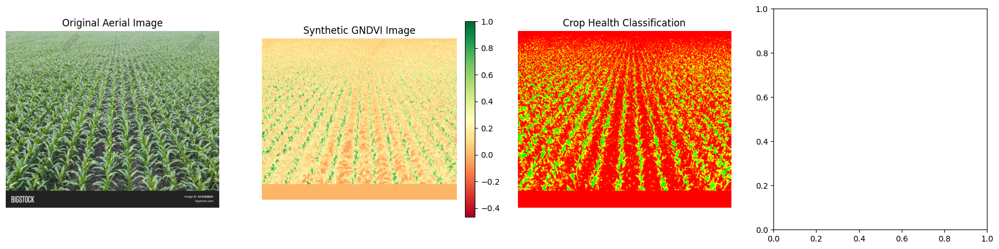

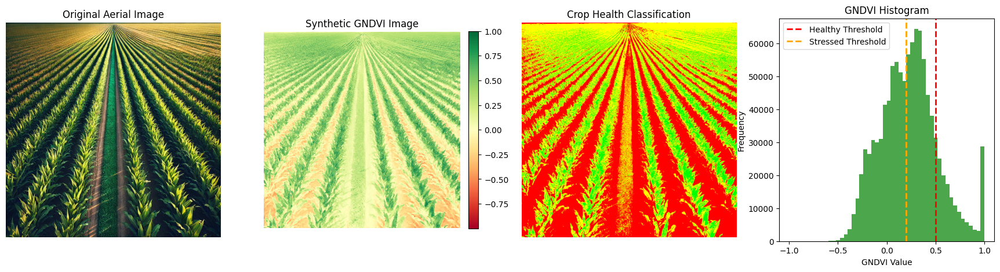

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the aerial image (Change 'your_image.jpg' to your actual file path)
image_path = "/content/test2.jpg"
image = cv2.imread(image_path)

# Convert image to RGB (OpenCV loads in BGR by default)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Extract Green and Blue channels
green = image[:, :, 1].astype(np.float32)
blue = image[:, :, 2].astype(np.float32)

# Compute Synthetic GNDVI
gndvi = (green - blue) / (green + blue + 1e-6)  # Avoid division by zero
gndvi = np.clip(gndvi, -1, 1)  # Normalize values between -1 and 1

# Crop Health Classification Based on GNDVI
healthy_mask = gndvi > 0.5   # Healthy (Green)
moderate_mask = (gndvi > 0.2) & (gndvi <= 0.5)  # Moderate (Yellow)
stressed_mask = gndvi <= 0.2  # Stressed (Red)

# Create a color-coded crop health map
crop_health_map = np.zeros((gndvi.shape[0], gndvi.shape[1], 3), dtype=np.uint8)
crop_health_map[healthy_mask] = [0, 255, 0]  # Green (Healthy)
crop_health_map[moderate_mask] = [255, 255, 0]  # Yellow (Moderate)
crop_health_map[stressed_mask] = [255, 0, 0]  # Red (Stressed)

# Normalize GNDVI for visualization (0 to 255 scale)
gndvi_normalized = ((gndvi - np.min(gndvi)) / (np.max(gndvi) - np.min(gndvi)) * 255).astype(np.uint8)

# Plot Original, GNDVI Image, Crop Health Map, and Histogram
fig, ax = plt.subplots(1, 4, figsize=(22, 5))

# Original Image
ax[0].imshow(image)
ax[0].set_title("Original Aerial Image")
ax[0].axis("off")

# GNDVI Visualization
gndvi_plot = ax[1].imshow(gndvi, cmap="RdYlGn")  # Green = Healthy, Red = Stressed
ax[1].set_title("Synthetic GNDVI Image")
ax[1].axis("off")
plt.colorbar(gndvi_plot, ax=ax[1], fraction=0.046, pad=0.04)

# Crop Health Map
ax[2].imshow(crop_health_map)
ax[2].set_title("Crop Health Classification")
ax[2].axis("off")

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the aerial image (Change 'your_image.jpg' to your actual file path)
image_path = "/content/DALL·E 2025-03-19 11.36.59 - A highly realistic aerial view of a large agricultural crop field taken from a drone. The field has well-defined rows of green crops with visible soil.webp"
image = cv2.imread(image_path)

# Convert image to RGB (OpenCV loads in BGR by default)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Extract Green and Blue channels
green = image[:, :, 1].astype(np.float32)
blue = image[:, :, 2].astype(np.float32)

# Compute Synthetic GNDVI
gndvi = (green - blue) / (green + blue + 1e-6)  # Avoid division by zero
gndvi = np.clip(gndvi, -1, 1)  # Normalize values between -1 and 1

# Crop Health Classification Based on GNDVI
healthy_mask = gndvi > 0.5   # Healthy (Green)
moderate_mask = (gndvi > 0.2) & (gndvi <= 0.5)  # Moderate (Yellow)
stressed_mask = gndvi <= 0.2  # Stressed (Red)

# Create a color-coded crop health map
crop_health_map = np.zeros((gndvi.shape[0], gndvi.shape[1], 3), dtype=np.uint8)
crop_health_map[healthy_mask] = [0, 255, 0]  # Green (Healthy)
crop_health_map[moderate_mask] = [255, 255, 0]  # Yellow (Moderate)
crop_health_map[stressed_mask] = [255, 0, 0]  # Red (Stressed)

# Normalize GNDVI for visualization (0 to 255 scale)
gndvi_normalized = ((gndvi - np.min(gndvi)) / (np.max(gndvi) - np.min(gndvi)) * 255).astype(np.uint8)

# Plot Original, GNDVI Image, Crop Health Map, and Histogram
fig, ax = plt.subplots(1, 4, figsize=(22, 5))

# Original Image
ax[0].imshow(image)
ax[0].set_title("Original Aerial Image")
ax[0].axis("off")

# GNDVI Visualization
gndvi_plot = ax[1].imshow(gndvi, cmap="RdYlGn")  # Green = Healthy, Red = Stressed
ax[1].set_title("Synthetic GNDVI Image")
ax[1].axis("off")
plt.colorbar(gndvi_plot, ax=ax[1], fraction=0.046, pad=0.04)

# Crop Health Map
ax[2].imshow(crop_health_map)
ax[2].set_title("Crop Health Classification")
ax[2].axis("off")

# Histogram of GNDVI Values with Annotations
ax[3].hist(gndvi.ravel(), bins=50, color='green', alpha=0.7)
ax[3].axvline(x=0.5, color='red', linestyle='dashed', linewidth=2, label='Healthy Threshold')
ax[3].axvline(x=0.2, color='orange', linestyle='dashed', linewidth=2, label='Stressed Threshold')
ax[3].set_title('GNDVI Histogram')
ax[3].set_xlabel('GNDVI Value')
ax[3].set_ylabel('Frequency')
ax[3].legend()

plt.show()

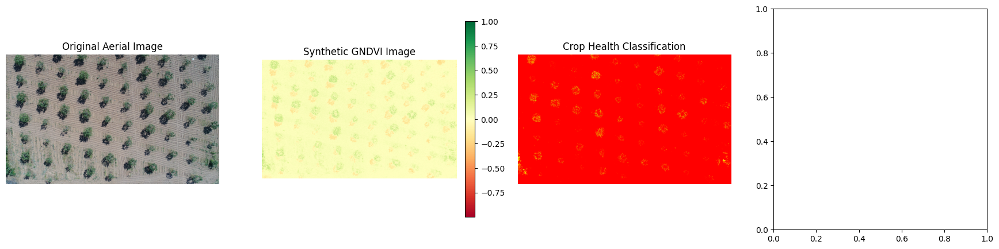

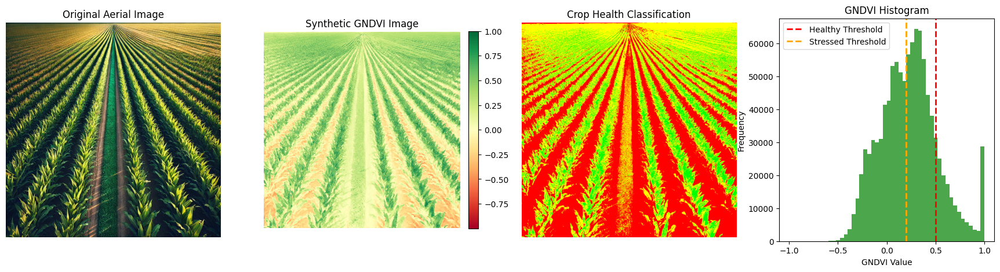

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the aerial image (Change 'your_image.jpg' to your actual file path)
image_path = "/content/DJI_0027.JPG"
image = cv2.imread(image_path)

# Convert image to RGB (OpenCV loads in BGR by default)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Extract Green and Blue channels
green = image[:, :, 1].astype(np.float32)
blue = image[:, :, 2].astype(np.float32)

# Compute Synthetic GNDVI
gndvi = (green - blue) / (green + blue + 1e-6)  # Avoid division by zero
gndvi = np.clip(gndvi, -1, 1)  # Normalize values between -1 and 1

# Crop Health Classification Based on GNDVI
healthy_mask = gndvi > 0.5   # Healthy (Green)
moderate_mask = (gndvi > 0.2) & (gndvi <= 0.5)  # Moderate (Yellow)
stressed_mask = gndvi <= 0.2  # Stressed (Red)

# Create a color-coded crop health map
crop_health_map = np.zeros((gndvi.shape[0], gndvi.shape[1], 3), dtype=np.uint8)
crop_health_map[healthy_mask] = [0, 255, 0]  # Green (Healthy)
crop_health_map[moderate_mask] = [255, 255, 0]  # Yellow (Moderate)
crop_health_map[stressed_mask] = [255, 0, 0]  # Red (Stressed)

# Normalize GNDVI for visualization (0 to 255 scale)
gndvi_normalized = ((gndvi - np.min(gndvi)) / (np.max(gndvi) - np.min(gndvi)) * 255).astype(np.uint8)

# Plot Original, GNDVI Image, Crop Health Map, and Histogram
fig, ax = plt.subplots(1, 4, figsize=(22, 5))

# Original Image
ax[0].imshow(image)
ax[0].set_title("Original Aerial Image")
ax[0].axis("off")

# GNDVI Visualization
gndvi_plot = ax[1].imshow(gndvi, cmap="RdYlGn")  # Green = Healthy, Red = Stressed
ax[1].set_title("Synthetic GNDVI Image")
ax[1].axis("off")
plt.colorbar(gndvi_plot, ax=ax[1], fraction=0.046, pad=0.04)

# Crop Health Map
ax[2].imshow(crop_health_map)
ax[2].set_title("Crop Health Classification")
ax[2].axis("off")

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the aerial image (Change 'your_image.jpg' to your actual file path)
image_path = "/content/DALL·E 2025-03-19 11.36.59 - A highly realistic aerial view of a large agricultural crop field taken from a drone. The field has well-defined rows of green crops with visible soil.webp"
image = cv2.imread(image_path)

# Convert image to RGB (OpenCV loads in BGR by default)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Extract Green and Blue channels
green = image[:, :, 1].astype(np.float32)
blue = image[:, :, 2].astype(np.float32)

# Compute Synthetic GNDVI
gndvi = (green - blue) / (green + blue + 1e-6)  # Avoid division by zero
gndvi = np.clip(gndvi, -1, 1)  # Normalize values between -1 and 1

# Crop Health Classification Based on GNDVI
healthy_mask = gndvi > 0.5   # Healthy (Green)
moderate_mask = (gndvi > 0.2) & (gndvi <= 0.5)  # Moderate (Yellow)
stressed_mask = gndvi <= 0.2  # Stressed (Red)

# Create a color-coded crop health map
crop_health_map = np.zeros((gndvi.shape[0], gndvi.shape[1], 3), dtype=np.uint8)
crop_health_map[healthy_mask] = [0, 255, 0]  # Green (Healthy)
crop_health_map[moderate_mask] = [255, 255, 0]  # Yellow (Moderate)
crop_health_map[stressed_mask] = [255, 0, 0]  # Red (Stressed)

# Normalize GNDVI for visualization (0 to 255 scale)
gndvi_normalized = ((gndvi - np.min(gndvi)) / (np.max(gndvi) - np.min(gndvi)) * 255).astype(np.uint8)

# Plot Original, GNDVI Image, Crop Health Map, and Histogram
fig, ax = plt.subplots(1, 4, figsize=(22, 5))

# Original Image
ax[0].imshow(image)
ax[0].set_title("Original Aerial Image")
ax[0].axis("off")

# GNDVI Visualization
gndvi_plot = ax[1].imshow(gndvi, cmap="RdYlGn")  # Green = Healthy, Red = Stressed
ax[1].set_title("Synthetic GNDVI Image")
ax[1].axis("off")
plt.colorbar(gndvi_plot, ax=ax[1], fraction=0.046, pad=0.04)

# Crop Health Map
ax[2].imshow(crop_health_map)
ax[2].set_title("Crop Health Classification")
ax[2].axis("off")

# Histogram of GNDVI Values with Annotations
ax[3].hist(gndvi.ravel(), bins=50, color='green', alpha=0.7)
ax[3].axvline(x=0.5, color='red', linestyle='dashed', linewidth=2, label='Healthy Threshold')
ax[3].axvline(x=0.2, color='orange', linestyle='dashed', linewidth=2, label='Stressed Threshold')
ax[3].set_title('GNDVI Histogram')
ax[3].set_xlabel('GNDVI Value')
ax[3].set_ylabel('Frequency')
ax[3].legend()

plt.show()

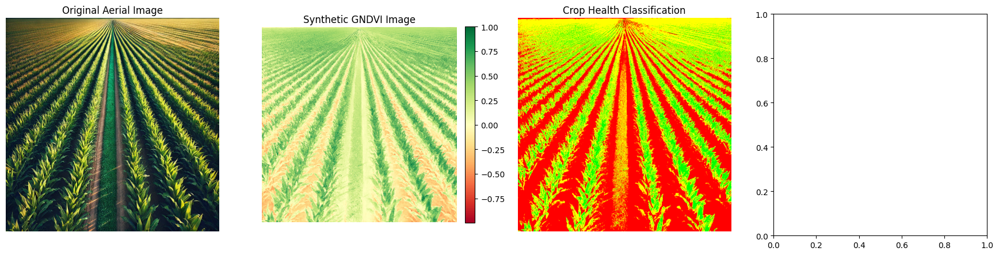

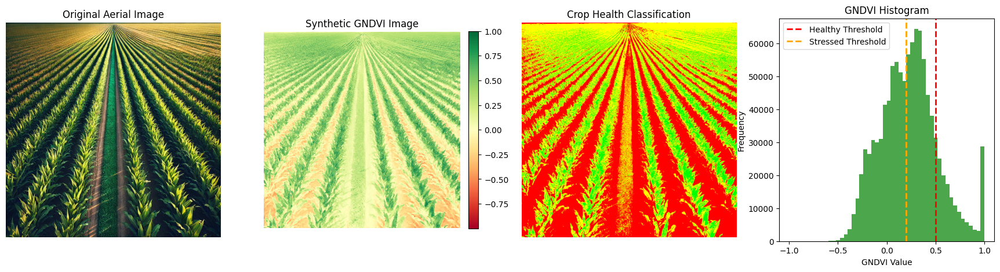

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the aerial image (Change 'your_image.jpg' to your actual file path)
image_path = "/content/DALL·E 2025-03-19 11.36.59 - A highly realistic aerial view of a large agricultural crop field taken from a drone. The field has well-defined rows of green crops with visible soil.webp"
image = cv2.imread(image_path)

# Convert image to RGB (OpenCV loads in BGR by default)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Extract Green and Blue channels
green = image[:, :, 1].astype(np.float32)
blue = image[:, :, 2].astype(np.float32)

# Compute Synthetic GNDVI
gndvi = (green - blue) / (green + blue + 1e-6)  # Avoid division by zero
gndvi = np.clip(gndvi, -1, 1)  # Normalize values between -1 and 1

# Crop Health Classification Based on GNDVI
healthy_mask = gndvi > 0.5   # Healthy (Green)
moderate_mask = (gndvi > 0.2) & (gndvi <= 0.5)  # Moderate (Yellow)
stressed_mask = gndvi <= 0.2  # Stressed (Red)

# Create a color-coded crop health map
crop_health_map = np.zeros((gndvi.shape[0], gndvi.shape[1], 3), dtype=np.uint8)
crop_health_map[healthy_mask] = [0, 255, 0]  # Green (Healthy)
crop_health_map[moderate_mask] = [255, 255, 0]  # Yellow (Moderate)
crop_health_map[stressed_mask] = [255, 0, 0]  # Red (Stressed)

# Normalize GNDVI for visualization (0 to 255 scale)
gndvi_normalized = ((gndvi - np.min(gndvi)) / (np.max(gndvi) - np.min(gndvi)) * 255).astype(np.uint8)

# Plot Original, GNDVI Image, Crop Health Map, and Histogram
fig, ax = plt.subplots(1, 4, figsize=(22, 5))

# Original Image
ax[0].imshow(image)
ax[0].set_title("Original Aerial Image")
ax[0].axis("off")

# GNDVI Visualization
gndvi_plot = ax[1].imshow(gndvi, cmap="RdYlGn")  # Green = Healthy, Red = Stressed
ax[1].set_title("Synthetic GNDVI Image")
ax[1].axis("off")
plt.colorbar(gndvi_plot, ax=ax[1], fraction=0.046, pad=0.04)

# Crop Health Map
ax[2].imshow(crop_health_map)
ax[2].set_title("Crop Health Classification")
ax[2].axis("off")

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the aerial image (Change 'your_image.jpg' to your actual file path)
image_path = "/content/DALL·E 2025-03-19 11.36.59 - A highly realistic aerial view of a large agricultural crop field taken from a drone. The field has well-defined rows of green crops with visible soil.webp"
image = cv2.imread(image_path)

# Convert image to RGB (OpenCV loads in BGR by default)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Extract Green and Blue channels
green = image[:, :, 1].astype(np.float32)
blue = image[:, :, 2].astype(np.float32)

# Compute Synthetic GNDVI
gndvi = (green - blue) / (green + blue + 1e-6)  # Avoid division by zero
gndvi = np.clip(gndvi, -1, 1)  # Normalize values between -1 and 1

# Crop Health Classification Based on GNDVI
healthy_mask = gndvi > 0.5   # Healthy (Green)
moderate_mask = (gndvi > 0.2) & (gndvi <= 0.5)  # Moderate (Yellow)
stressed_mask = gndvi <= 0.2  # Stressed (Red)

# Create a color-coded crop health map
crop_health_map = np.zeros((gndvi.shape[0], gndvi.shape[1], 3), dtype=np.uint8)
crop_health_map[healthy_mask] = [0, 255, 0]  # Green (Healthy)
crop_health_map[moderate_mask] = [255, 255, 0]  # Yellow (Moderate)
crop_health_map[stressed_mask] = [255, 0, 0]  # Red (Stressed)

# Normalize GNDVI for visualization (0 to 255 scale)
gndvi_normalized = ((gndvi - np.min(gndvi)) / (np.max(gndvi) - np.min(gndvi)) * 255).astype(np.uint8)

# Plot Original, GNDVI Image, Crop Health Map, and Histogram
fig, ax = plt.subplots(1, 4, figsize=(22, 5))

# Original Image
ax[0].imshow(image)
ax[0].set_title("Original Aerial Image")
ax[0].axis("off")

# GNDVI Visualization
gndvi_plot = ax[1].imshow(gndvi, cmap="RdYlGn")  # Green = Healthy, Red = Stressed
ax[1].set_title("Synthetic GNDVI Image")
ax[1].axis("off")
plt.colorbar(gndvi_plot, ax=ax[1], fraction=0.046, pad=0.04)

# Crop Health Map
ax[2].imshow(crop_health_map)
ax[2].set_title("Crop Health Classification")
ax[2].axis("off")

# Histogram of GNDVI Values with Annotations
ax[3].hist(gndvi.ravel(), bins=50, color='green', alpha=0.7)
ax[3].axvline(x=0.5, color='red', linestyle='dashed', linewidth=2, label='Healthy Threshold')
ax[3].axvline(x=0.2, color='orange', linestyle='dashed', linewidth=2, label='Stressed Threshold')
ax[3].set_title('GNDVI Histogram')
ax[3].set_xlabel('GNDVI Value')
ax[3].set_ylabel('Frequency')
ax[3].legend()

plt.show()

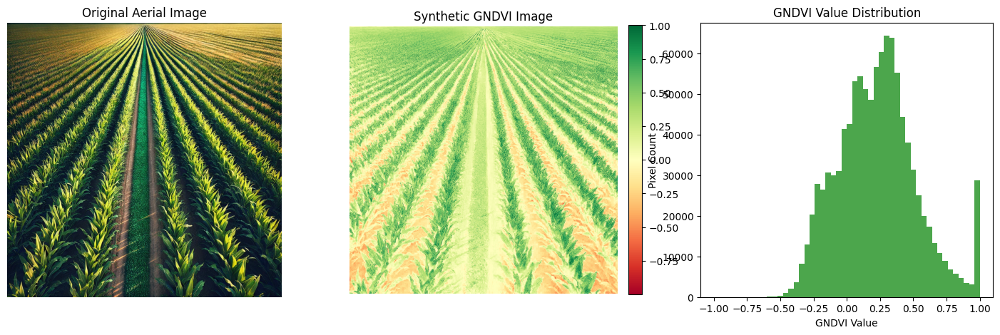

GNDVI Image saved as 'gndvi_output.png'


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the aerial image (Change 'your_image.jpg' to your actual file path)
image_path = "/content/DALL·E 2025-03-19 11.36.59 - A highly realistic aerial view of a large agricultural crop field taken from a drone. The field has well-defined rows of green crops with visible soil.webp"
image = cv2.imread(image_path)

# Convert image to RGB (OpenCV loads in BGR by default)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Extract Green and Blue channels
green = image[:, :, 1].astype(np.float32)
blue = image[:, :, 2].astype(np.float32)

# Compute Synthetic GNDVI
gndvi = (green - blue) / (green + blue + 1e-6)  # Avoid division by zero
gndvi = np.clip(gndvi, -1, 1)  # Normalize values between -1 and 1

# Normalize GNDVI for visualization (0 to 255 scale)
gndvi_normalized = ((gndvi - np.min(gndvi)) / (np.max(gndvi) - np.min(gndvi)) * 255).astype(np.uint8)

# Plot Original, GNDVI Image, and Histogram
fig, ax = plt.subplots(1, 3, figsize=(18, 5))

# Original Image
ax[0].imshow(image)
ax[0].set_title("Original Aerial Image")
ax[0].axis("off")

# GNDVI Visualization
gndvi_plot = ax[1].imshow(gndvi, cmap="RdYlGn")  # Green = Healthy, Red = Stressed
ax[1].set_title("Synthetic GNDVI Image")
ax[1].axis("off")
plt.colorbar(gndvi_plot, ax=ax[1], fraction=0.046, pad=0.04)

# Histogram of GNDVI Values
ax[2].hist(gndvi.ravel(), bins=50, color='green', alpha=0.7)
ax[2].set_title("GNDVI Value Distribution")
ax[2].set_xlabel("GNDVI Value")
ax[2].set_ylabel("Pixel Count")

plt.show()

# Save the GNDVI Image
cv2.imwrite("gndvi_output.png", gndvi_normalized)
print("GNDVI Image saved as 'gndvi_output.png'")


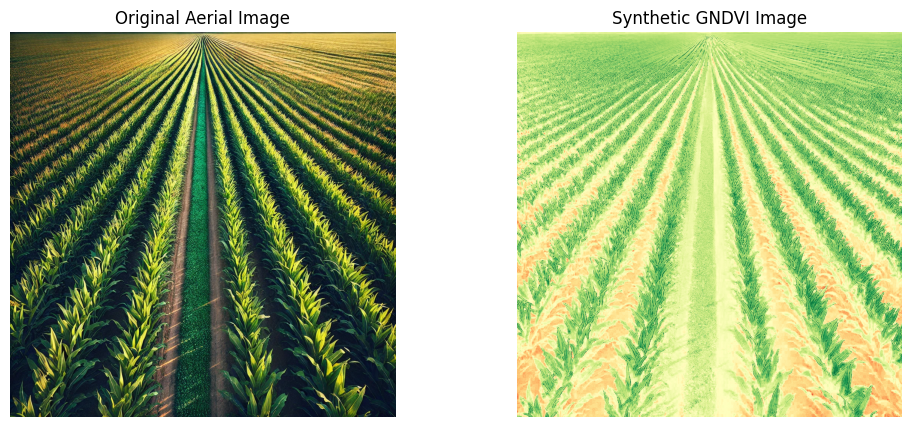

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the aerial image (Change 'your_image.jpg' to your actual file path)
image_path = "/content/DALL·E 2025-03-19 11.36.59 - A highly realistic aerial view of a large agricultural crop field taken from a drone. The field has well-defined rows of green crops with visible soil.webp"
image = cv2.imread(image_path)

# Convert image to RGB (OpenCV loads in BGR by default)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Extract Green and Blue channels
green = image[:, :, 1].astype(np.float32)
blue = image[:, :, 2].astype(np.float32)

# Compute Synthetic GNDVI
gndvi = (green - blue) / (green + blue + 1e-6)  # Avoid division by zero
gndvi = np.clip(gndvi, -1, 1)  # Normalize values between -1 and 1

# Plot Original and GNDVI Image
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].imshow(image)
ax[0].set_title("Original Aerial Image")
ax[0].axis("off")

ax[1].imshow(gndvi, cmap="RdYlGn")  # Color map: Red (stressed) → Green (healthy)
ax[1].set_title("Synthetic GNDVI Image")
ax[1].axis("off")

plt.show()
